<a href="https://colab.research.google.com/github/khiro45/MC-datathon-/blob/main/MCdatathon_Data_science_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing modules

In [ ]:
import cv2
import tensorflow as tf
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
import math
import os

the work flow in the project will be

1-loading vidio and extract frame images from them

2-combining

In [ ]:
#vid paths

list_of_vids_paths=['/content/drive/MyDrive/ai datathon/AI datathon/VID_20240407_163112.mp4',
                    '/content/drive/MyDrive/ai datathon/AI datathon/VID_20240407_163452.mp4',
                    '/content/drive/MyDrive/ai datathon/AI datathon/VID_20240407_163620.mp4']
                    #'/content/drive/MyDrive/ai datathon/AI datathon/VID_20240407_163907.mp4']

 #labels list i had a parobel with ram so i didnt use the 4th label
list_of_places=['info','civil','math']
df = pd.DataFrame(columns=['image_path', 'label'])

#frame skip used to not load all frames of vid to optimse it
frame_skip = 20


#divide vid to a frames and store them
for i, video_path in enumerate(list_of_vids_paths):
    num = 0
    count = 0
    vid = cv2.VideoCapture(video_path)
    folder_index = list_of_places[i]
    while vid.isOpened():
        ret, frame = vid.read()
        if not ret:
          print('error in ',list_of_vids_paths[i])
          break
        if count % frame_skip == 0:
            cv2.imwrite(f'/content/drive/MyDrive/ai datathon/dataset/{folder_index}/{num}.png', frame)
            num += 1
        count += 1

    vid.release()

cv2.destroyAllWindows()


In [ ]:
df_test = pd.DataFrame(columns=['image_path', 'label'])
for folder_name in os.listdir('/content/drive/MyDrive/ai datathon/dataset'):

        for file_name in os.listdir('/content/drive/MyDrive/ai datathon/dataset/' + str(folder_name)):
            df.loc[len(df)] = {'image_path': f'/content/drive/MyDrive/ai datathon/dataset/{str(folder_name)}/{str(file_name)}', 'label': folder_name}
df

## Snitching

Reading folder: 1
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/0.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/1.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/2.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/3.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/4.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/5.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/6.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/7.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/8.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/9.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/10.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/11.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/12.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/13.png
Image loaded: /content/drive/MyDrive/ai datathon/dataset/1/14.png
Im

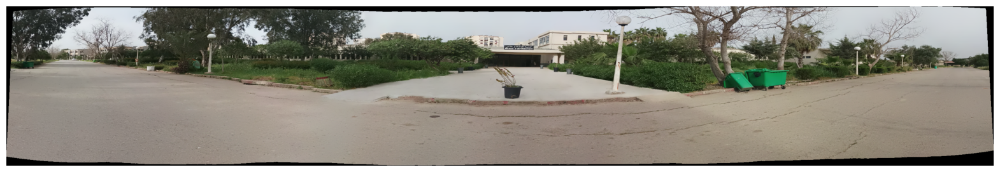

In [ ]:
width, height = 500,500
results = []


list_img = []
folder_name='1'
print('Reading folder:', folder_name)
#load frames imgs in to a imgs arry
for img_filename in os.listdir('/content/drive/MyDrive/ai datathon/dataset/' + folder_name):
        img_path = os.path.join('/content/drive/MyDrive/ai datathon/dataset', folder_name, img_filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (width, height))

        if img is not None:
            print('Image loaded:', img_path)
            list_img.append(img)
        else:
            print("Error reading:", img_path)
#stitch the imges in the arry
if len(list_img) > 1:
        tuple_img = tuple(list_img)
        stitch = cv2.Stitcher_create()
        status, result = stitch.stitch(tuple_img)
        if status == cv2.Stitcher_OK:
            plt.figure(figsize=[20, 10])
            plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()
            print('Stitching successful for folder:', folder_name)
            results.append(result)
        else:
            print('Stitching failed for folder:', folder_name)
else:
        print('Insufficient images for stitching in folder:', folder_name)

print('Stitching completed for all folders.')


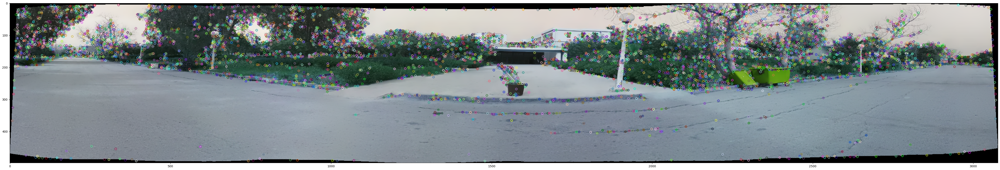

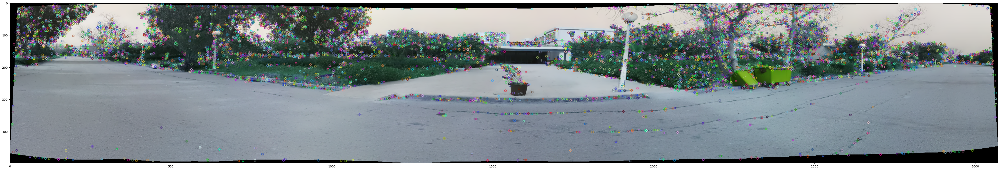

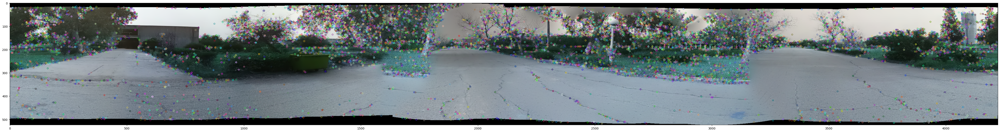

In [ ]:
i=0

#load stitched imgs to use SIFT
npz_pathes=[]
for result in results:
  gray_panoramic = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)

  sift = cv2.SIFT_create()
  keypoints, descriptors = sift.detectAndCompute(gray_panoramic, None)
  panoramic_with_keypoints = cv2.drawKeypoints(result, keypoints, None)
  plt.figure(figsize=[60,10])
  plt.imshow(panoramic_with_keypoints)

  keypoints_array = np.array([kp.pt for kp in keypoints])
  descriptors_array = descriptors.astype(np.float32)
  i+=1
  npz_file_path = f'/content/drive/MyDrive/ai datathon/test/sfit data/sift_features{i}.npz'
  npz_pathes.append(npz_file_path)
  # Save keypoints and descriptors to NPZ file
  np.savez(npz_file_path, keypoints=keypoints_array, descriptors=descriptors_array)



In [ ]:
npz_files_dir = '/content/drive/MyDrive/ai datathon/test/sfit data'

# Load descriptors and labels for each label
descriptors_list = []
labels_list = []
list_of_places=['1', '2', '3']
for folder_name in list_of_places:
    #npz_file_path = os.path.join(npz_files_dir, f'sift_features_{folder_name}.npz')  # Modify this line
    npz_data = np.load('/content/drive/MyDrive/ai datathon/test/sfit data/sift_features1.npz')
    descriptors = npz_data['descriptors']
    descriptors_list.append(descriptors)
    labels_list.extend([folder_name] * descriptors.shape[0])

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X = np.vstack(descriptors_list)
y = np.array(labels_list)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVC model
svc_model = SVC()
svc_model.fit(X_train, y_train)

# Evaluate the trained model
y_pred = svc_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Time's Up! That's all we could do so far here